<a href="https://colab.research.google.com/github/rahiakela/computer-vision-research-and-practice/blob/main/opencv-projects-and-guide/ocr-works/05_image_preprocessing_with_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Image preprocessing with OpenCV

**Reference**

https://tesseract-ocr.github.io/tessdoc/ImproveQuality.html

https://stackoverflow.com/questions/33949831/how-to-remove-all-lines-and-borders-in-an-image-while-keeping-text-programmatica

https://github.com/wjbmattingly/ocr_python_textbook/blob/main/02_02_working%20with%20opencv.ipynb

##Setup

In [ ]:
%%shell

sudo apt install tesseract-ocr
sudo apt-get install poppler-utils
pip install tesseract
pip install pytesseract
pip install Pillow==9.0.0
pip install pdf2image
pip install neuspell

Just restart the colab environment.

In [1]:
import re
import cv2 
import numpy as np
import pytesseract
from pytesseract import Output
from textblob import TextBlob

from pdf2image import convert_from_path
from io import BytesIO
from PIL import Image
from matplotlib import pyplot as plt

In [ ]:
import neuspell
from neuspell import BertChecker

data folder is set to `/usr/local/lib/python3.7/dist-packages/neuspell/../data` script


In [ ]:
#neuspell.seq_modeling.downloads.download_pretrained_model("subwordbert-probwordnoise")
checker = BertChecker()
checker.from_pretrained()

In [ ]:
!tesseract --version

In [2]:
pytesseract.pytesseract.tesseract_cmd = (r'/usr/bin/tesseract')

In [3]:
def img_display(im_data):
    dpi = 80
    #im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [ ]:
image_name = 'sample2.png'

## Image preprocessing

###Obtain binary image

In [ ]:
image = cv2.imread(image_name)

# Binarization
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Thresholding 
img_thresh, img_binary = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)

###Noise Removal



In [ ]:
def noise_removal(image):
  kernel = np.ones((1, 1), np.uint8)
  image = cv2.dilate(image, kernel, iterations=1)

  kernel = np.ones((1, 1), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image = cv2.medianBlur(image, 3)

  return image

In [ ]:
# removing noise
noise_removed = noise_removal(img_binary)

img_display(noise_removed)

In [ ]:
def denoise_division(image):
  # blur
  blur = cv2.GaussianBlur(image, (0,0), sigmaX=33, sigmaY=33)

  # divide
  divide = cv2.divide(image, blur, scale=255)

  return divide

In [ ]:
# removing noise
noise_removed = denoise_division(gray_image)

img_display(noise_removed)

In [ ]:
def denoise_otus(image):
  # blur
  blur = cv2.GaussianBlur(image, (0,0), sigmaX=33, sigmaY=33)

  # divide
  divide = cv2.divide(image, blur, scale=255)

  # otsu threshold
  thresh = cv2.threshold(divide, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

  return thresh

In [ ]:
# removing noise
noise_removed = denoise_otus(gray_image)

img_display(noise_removed)

In [ ]:
def denoise_morph(image):
  # blur
  blur = cv2.GaussianBlur(image, (0,0), sigmaX=33, sigmaY=33)

  # divide
  divide = cv2.divide(image, blur, scale=255)

  # otsu threshold
  thresh = cv2.threshold(divide, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

  # apply morphology
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
  morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

  return morph

In [ ]:
# removing noise
noise_removed = denoise_morph(gray_image)

img_display(noise_removed)

In [ ]:
noiseless_image_bw = cv2.fastNlMeansDenoising(image, None, 40, 7, 21) 

# removing noise
#noise_removed = denoise_morph(noiseless_image_bw)

img_display(noiseless_image_bw)

###Decrease font thickness using Erosion

In [ ]:
def thin_font(image):
  image = cv2.bitwise_not(image)
  kernel = np.ones((2, 2), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.bitwise_not(image)
  
  return image

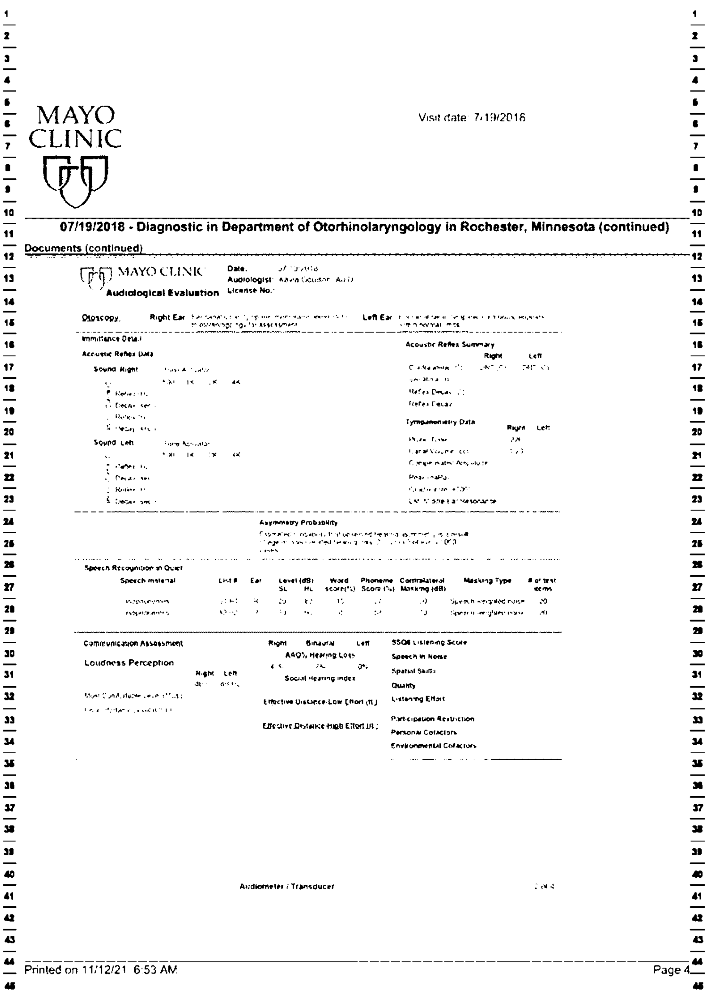

In [ ]:
# apply erosion
eroded_image = noise_removal(noise_removed)

img_display(eroded_image)

###Increase font thickness using Dilation

In [9]:
def thick_font(image):
  image = cv2.bitwise_not(image)
  kernel = np.ones((2, 2), np.uint8)
  image = cv2.dilate(image, kernel, iterations=1)
  image = cv2.bitwise_not(image)
  
  return image

In [ ]:
# apply dilation
dilated_image = thick_font(noise_removed)
img_display(dilated_image)

###Removing Borders

In [ ]:
def remove_borders(image):
  contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cntsSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
  cnt = cntsSorted[-1]
  x, y, w, h = cv2.boundingRect(cnt)
  cropped = image[y: y + h, x: x + w]

  return cropped

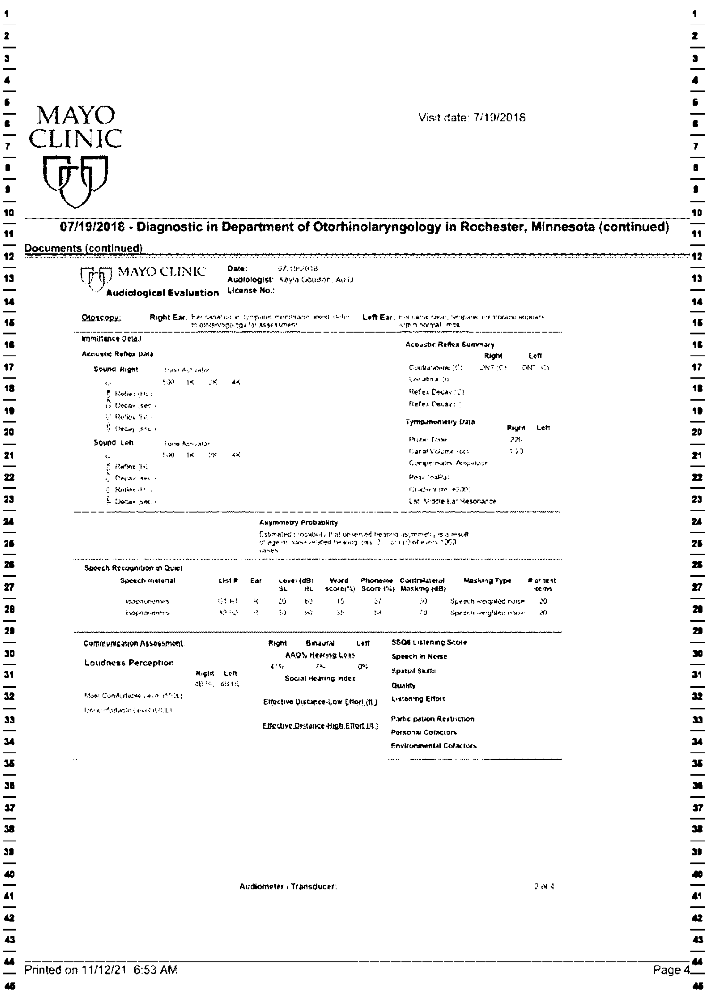

In [ ]:
no_borders = remove_borders(noise_removed)
img_display(no_borders)

###Remove horizontal/vertical lines

In [ ]:
result = image.copy()

# Obtain binary image
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Remove horizontal lines
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (100,1))
remove_horizontal = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
#contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts, _ = cv2.findContours(remove_horizontal, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(result, [c], -1, (255,255,255), 5)

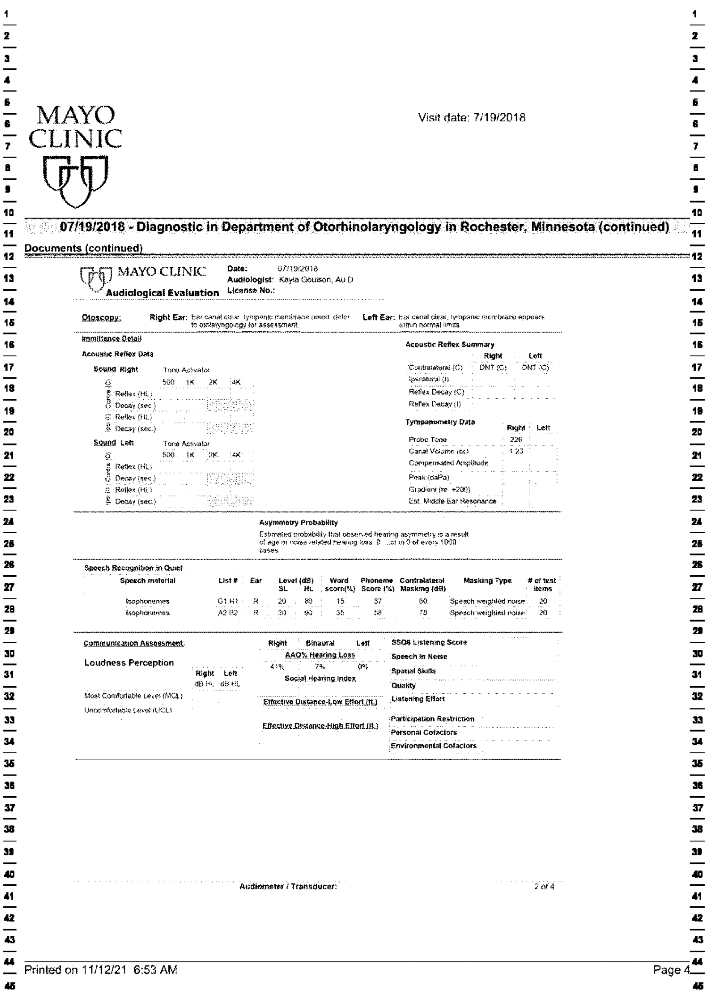

In [ ]:
cv2.imwrite('result.png', result)
image_result = cv2.imread("result.png")
img_display(image_result)

In [ ]:
# Remove vertical lines
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,80))
remove_vertical = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
cnts = cv2.findContours(remove_vertical, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(result, [c], -1, (255,255,255), 5)

In [ ]:
cv2.imwrite('result.png', result)

True

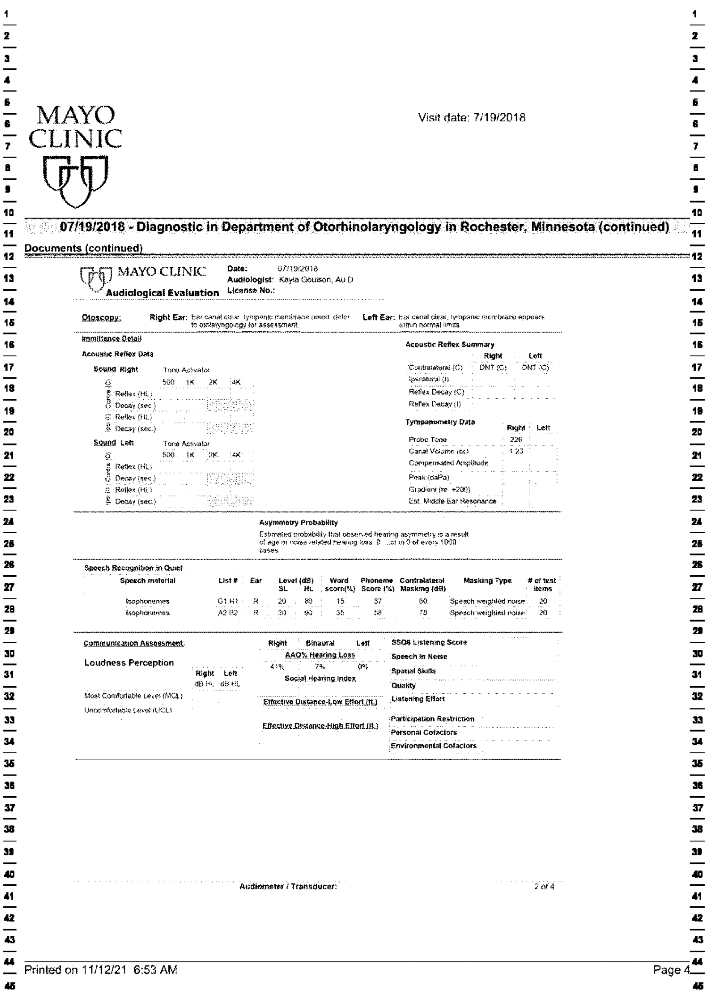

In [ ]:
image_result = cv2.imread("result.png")
img_display(image_result)

In [ ]:
laplacian = cv2.Laplacian(image,cv2.CV_8UC1) # Laplacian OR
edges = cv2.Canny(image,80,10,apertureSize = 3) # canny Edge OR
# Output dtype = cv2.CV_8U # Sobel
sobelx8u = cv2.Sobel(image,cv2.CV_8U,1,0,ksize=5)
# Output dtype = cv2.CV_64F. Then take its absolute and convert to cv2.CV_8U
sobelx64f = cv2.Sobel(image,cv2.CV_64F,1,0,ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)

# Hough's Probabilistic Line Transform 
minLineLength = 900
maxLineGap = 100
lines = cv2.HoughLinesP(edges,1,np.pi/180,100,minLineLength,maxLineGap)
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(image,(x1,y1),(x2,y2),(255,255,255),2)

cv2.imwrite('houghlines.jpg',image)

True

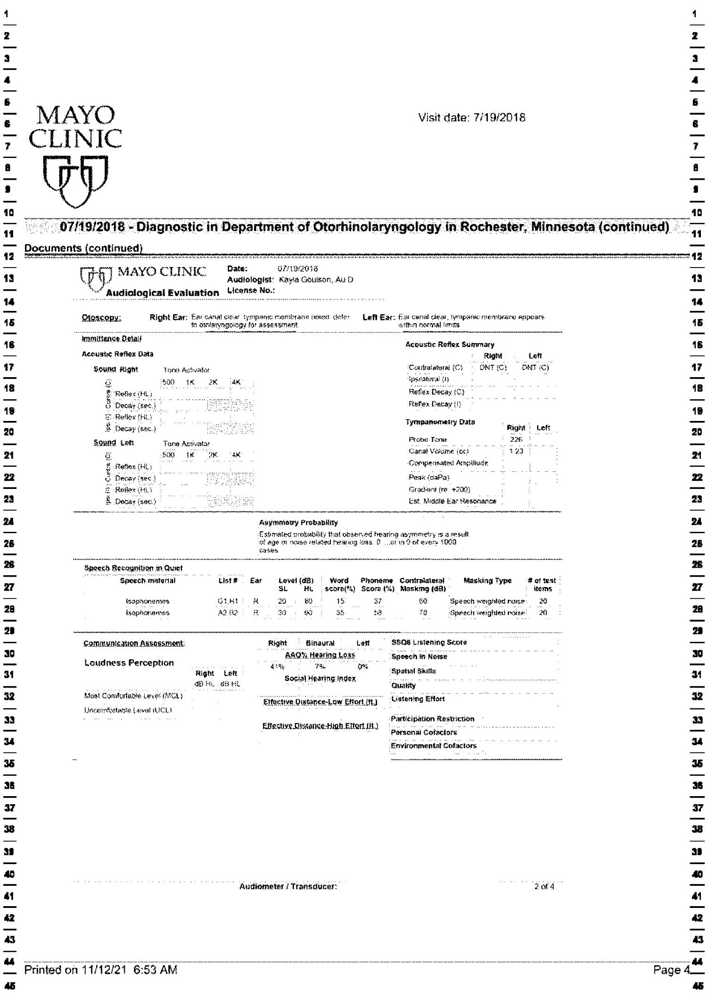

In [ ]:
image_result = cv2.imread("houghlines.jpg")
img_display(image_result)

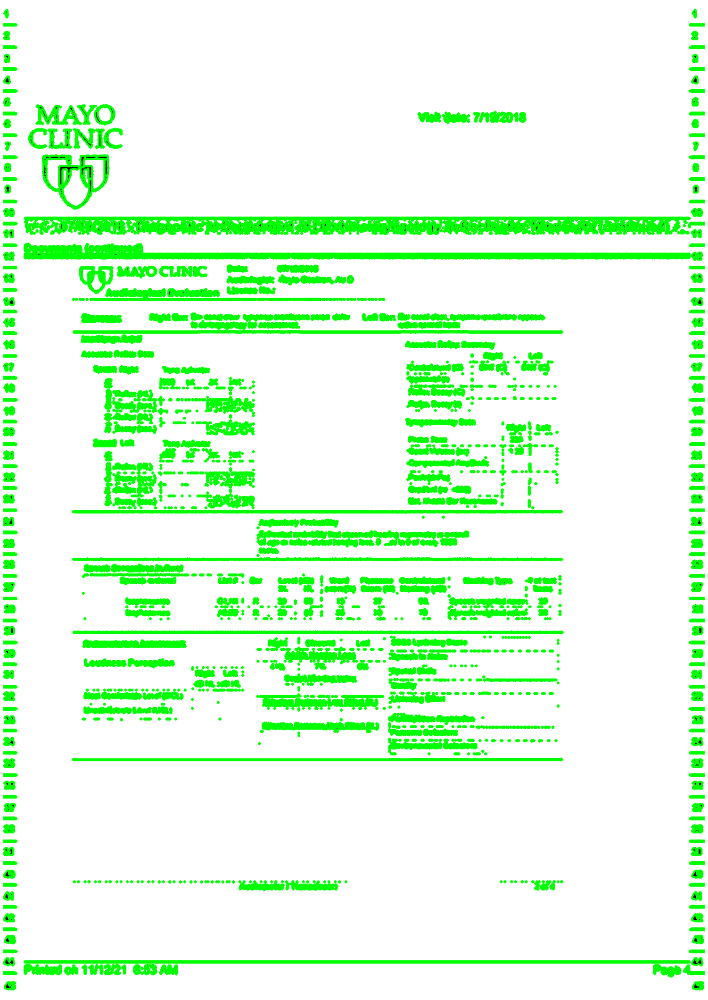

In [ ]:
image = cv2.imread('sample2.png')
im_bw = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

blur = cv2.GaussianBlur(im_bw, (5,5), 0)
im_bw = cv2.Canny(blur, 10, 90)

contours, hierarchy = cv2.findContours(im_bw, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image, contours, -1, (0,255,0), 3)
img_display(image)

###Image Cropping

In [ ]:
# Plot original image
image = cv2.imread(image_name)
print(image.shape)

(2339, 1653, 3)


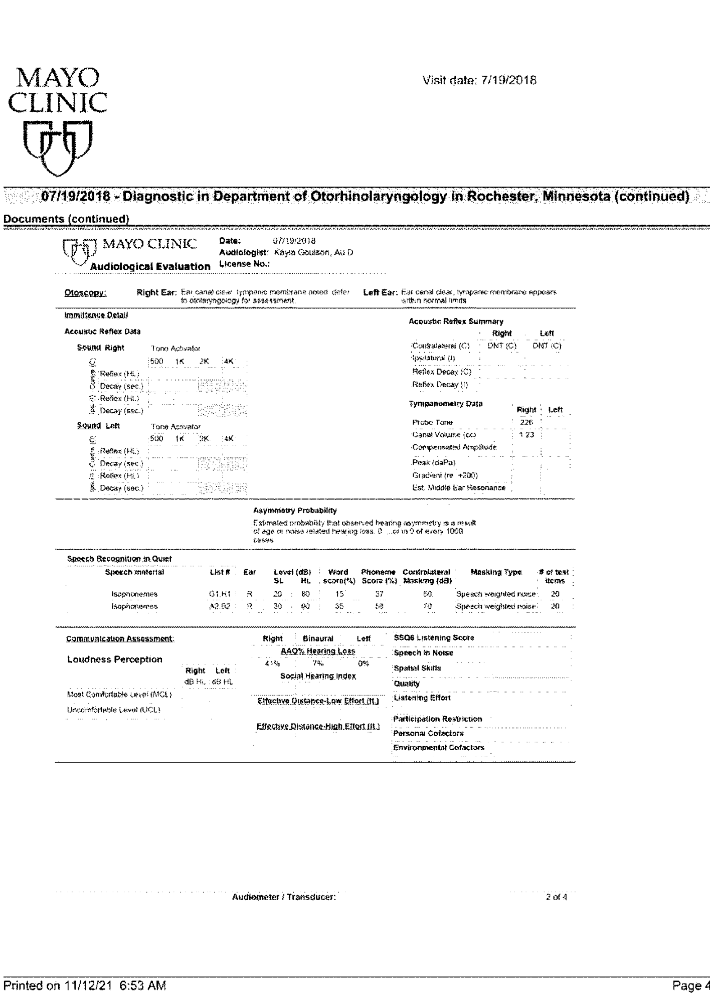

In [ ]:
# Cropping an image
cropped_image = image[100:2300, 50:1615]  # slicing image[rows, columns]
img_display(cropped_image)

###Enhance document using thresholding

https://medium.com/analytics-vidhya/enhance-a-document-scan-using-python-and-opencv-9934a0c2da3d

In [ ]:
pdf_file = 'document-page40.pdf'
pages = convert_from_path(pdf_file)
for page in pages:
  page.save("doc.jpg", "JPEG")

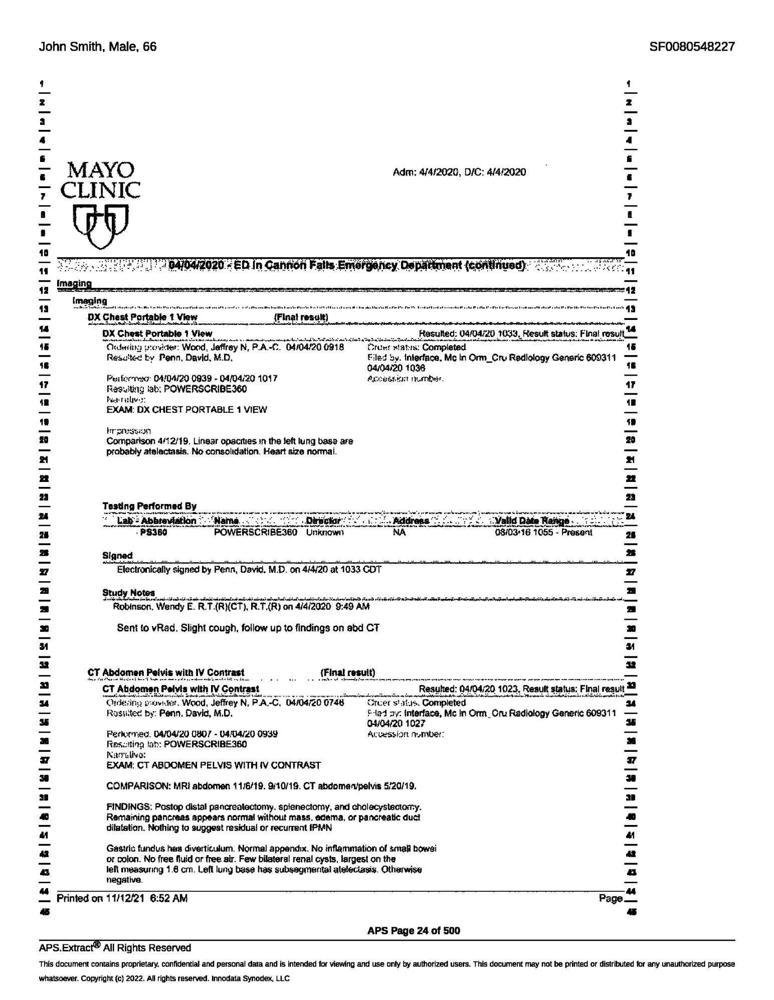

In [ ]:
image = cv2.imread("doc.jpg")

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, th = cv2.threshold(gray,
	127,  # threshold value
	255,  # maximum value assigned to pixel values exceeding the threshold
	cv2.THRESH_BINARY)  # threshold method type

img = denoise_division(th)
# increase the font size using dilation
image_smoothed = thick_font(img) 
img_display(image_smoothed)

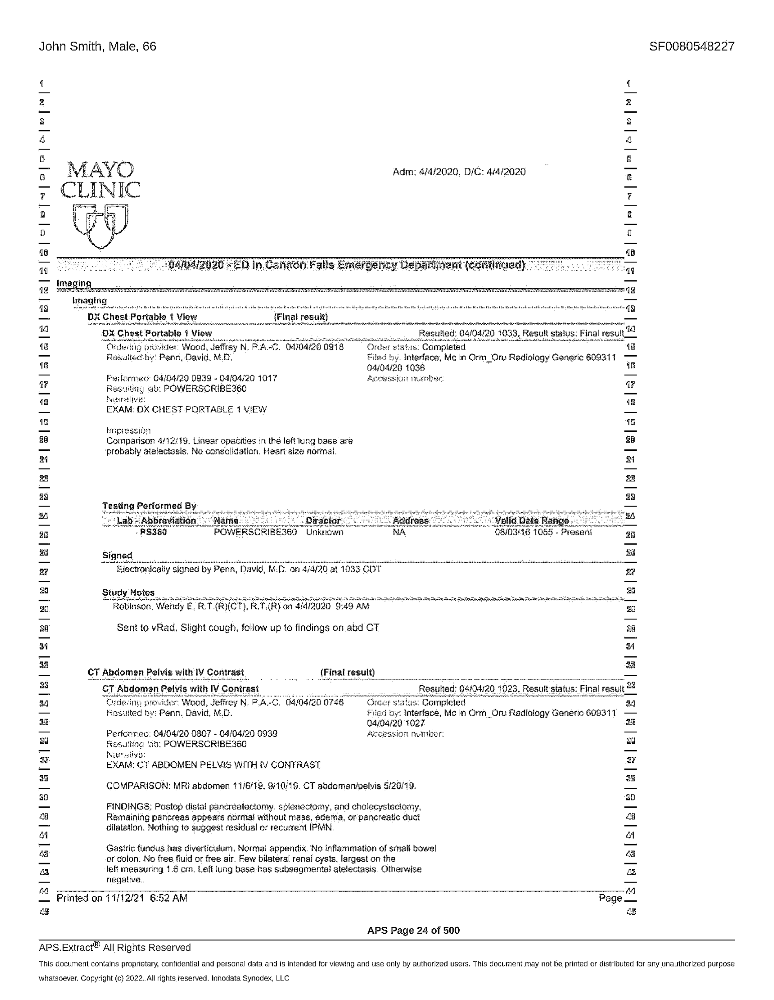

In [ ]:
image = cv2.imread("doc.jpg", 0)

img = cv2.adaptiveThreshold(image, 
    255,  # maximum value assigned to pixel values exceeding the threshold
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # gaussian weighted sum of neighborhood
    cv2.THRESH_BINARY,  # thresholding type
    5,  # block size (5x5 window)
    20)  # constant

img = denoise_division(img)
#img = thick_font(img) 
img_display(img)

In [ ]:
custom_config = r'--oem 3 --psm 12'
print('--------------------------------------------------------------')
# extract text from image
text_data = pytesseract.image_to_string(img, config=custom_config)
#text_b = TextBlob(text_data)
#corrected = text_b.correct()
print(text_data)
print('--------------------------------------------------------------')

--------------------------------------------------------------
John Smith, Male, 66

SF0080548227

MAYO

Adm: 4/4/2020, D/G: 4/4/2020

CLINIC

Ur

04/08/2020: - ED in Gannon Falls Emergency Depariment (continua)

bnaging

bx Chest Portable AMiew ”

sinreniereetannnnenin ant

Final result)

ie

eee

iene

stent

lelele{sleol=l[~l=|7ls1e1" i>

DX Chest Portable 1 View

sett

Rested: 04/04/20 1039, Result status. Final resu

ail

der: Wood, Jeffrey N. P.

04/04/20 0918

+

x Completed

15

lale]el[slSlsl]eler = lelelelers i>

B

Regulted- by’ Penn, David, 4.0.

/. interface, Me in Orm_Ons Radiology Generic 609311 ——

|

04j04/20 1036

3

array 04/04/20 0939 - 04/04/20 1017

act umber

aP

|

ab. POWERSCRIBES6O

ig

EXAM: DX CHEST PORTABLE 14 VIEW

4B

19

19

Impres:

20

Comparison 4/12/49. Linear opacities in the jeff lung base are

26

probably atelactasis. No consolidation. Heart-size normal

a

ae

:

Testing Periormed By

Nama.

id Date

Abbraviation:

ena

-Aeidress

ge

S360

FEB


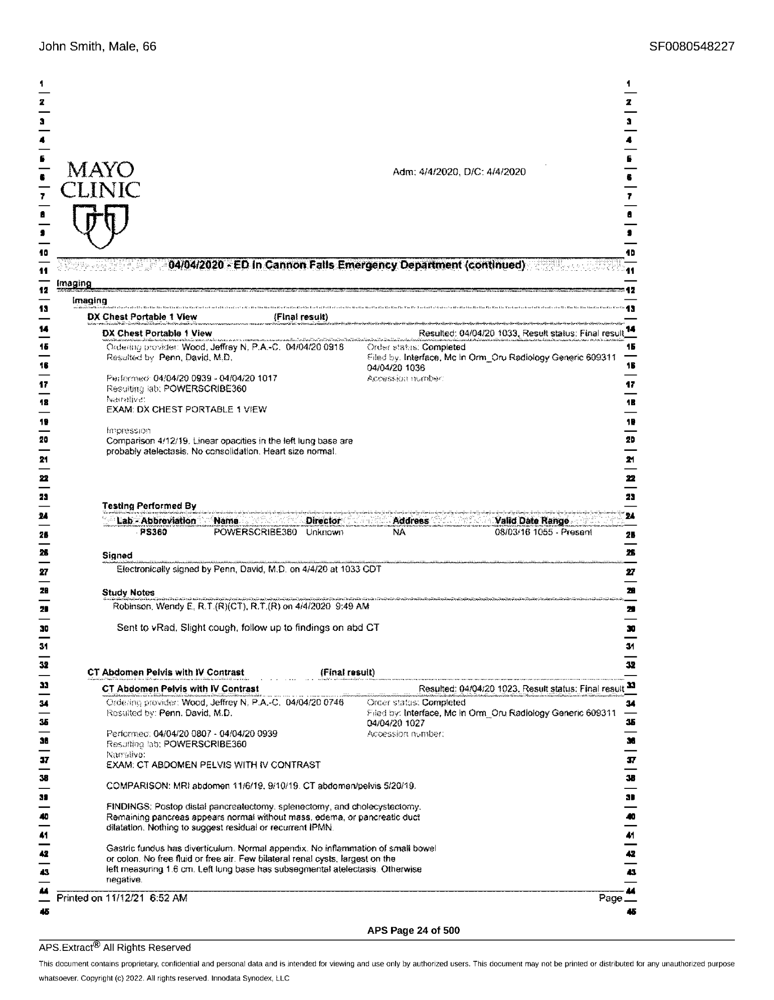

In [ ]:
image = cv2.imread("doc.jpg", 0)

ret, img = cv2.threshold(image,
    20,  # threshold value, ignored when using cv2.THRESH_OTSU
    255,  # maximum value assigned to pixel values exceeding the threshold
    cv2.THRESH_BINARY + cv2.THRESH_OTSU)  # thresholding type

#img = denoise_division(img)
#img = thick_font(img) 
img_display(img)

In [ ]:
custom_config = r'--oem 3 --psm 12'
print('--------------------------------------------------------------')
# extract text from image
text_data = pytesseract.image_to_string(img, config=custom_config)
#text_b = TextBlob(text_data)
#corrected = text_b.correct()
print(text_data)
print('--------------------------------------------------------------')

--------------------------------------------------------------
John Smith, Male, 66

SF0080548227

MAYO

Adm: 4/4/2020, D/C: 4/4/2020

CLINIC

04/04/2020 - ED in.Gannon Falis Emergency Department (continued)

W

fragin:

Imaging

a

ox Chest Portable a View

Ba lbmerenermeimnnenincen nese er Pees Pion

{Final result)

ee

Sentnatin te

sense!

Telelslelel=i~lelei lel" |-

“

DX Chest Portable 1 View

sent.

Resulted: 04/04/20 1033,

esult statu Final result “

16

ee

der: Wood, Jeffrey N. P.

o.

04/04/20 0918

+

tat

3: Completed

45

Resulted by Penn, David. M.,

16

Interface, Mc in Orm_Oru Radiology Generic 699311 —

04/04/28 1036

7

ey

forrnanes 04/04/20 0939 - 04/04/20 1017

&

ssigit auenbar

a

ab. POWERSCRIBES60

18

EXAM: DX CHEST PORTABLE 1 VIEW

4B

18

W

Impres:

A

20

Comparison 4/12/49. Linear opacities in the jeff lung base are

Py

probably atelectasis. No consolidation. Heart size normal

zy

Testing Performed By

Caio

Abbreviation

Nama.

Director

Addrees

id

###Deskew (straighten) text

In [30]:
# Calculate skew angle of an image
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 255, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=5)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    minAreaRect = cv2.minAreaRect(largestContour)

    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

In [31]:
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [6]:
pdf_file = 'document-page40.pdf'
pages = convert_from_path(pdf_file)
for page in pages:
  page.save("doc.jpg", "JPEG")

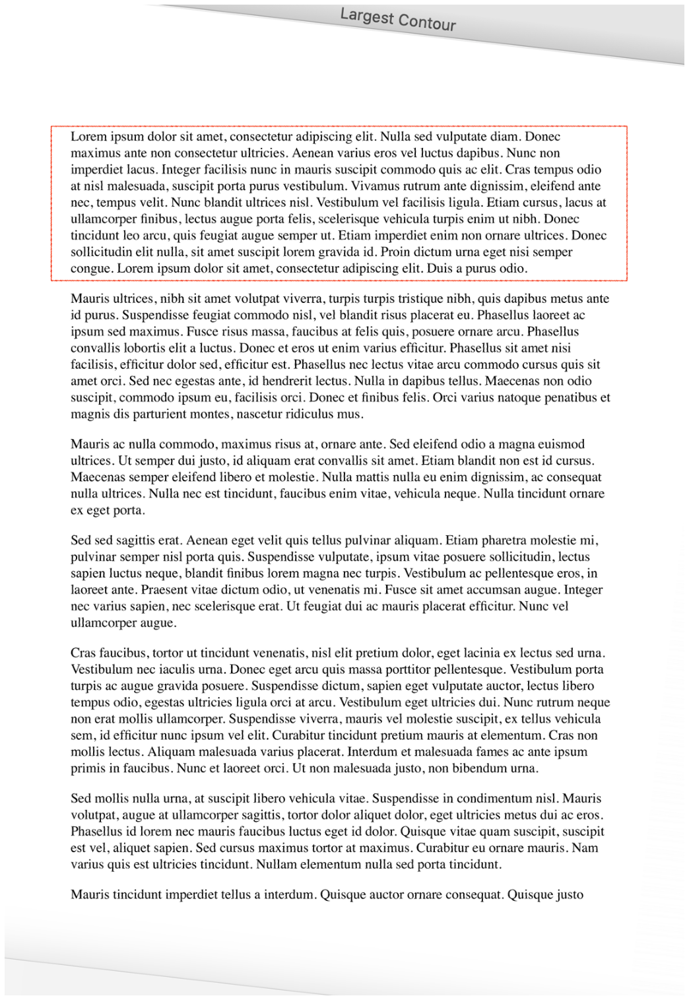

In [32]:
image = cv2.imread("test.png")

#image = denoise_division(image)
# image = thick_font(image) 
image = deskew(image)
# image = thick_font(image) 
img_display(image)

##Combining image preprocessing and OCR

###Image preprocessing

In [ ]:
img_display(image)

In [ ]:
def image_preprocessing(image_path, font_thick=False):
  image = cv2.imread(image_name)

  ############ Step-1: Image Binarization ##############################
  # Binarization
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # Thresholding 
  img_thresh, img_binary = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)

  ############ Step-2: Noise removal ###################################
  # removing noise
  image = noise_removal(img_binary)

  ############ Step-3: Image dilation ###################################
  if font_thick:
    # increase font thickness using dilation
    image = thick_font(image)

  ############ Step-4: Image cropping ###################################
  # Cropping an image, shape(2339, 1653, 3)
  # slicing image[rows, columns] like [100:2289, 50:1603] = [(2339 + 100 - 2339): (2339 - 50), ()1653 + 50 - 1653): (1653 - 50)] 
  image = image[(image.shape[0] + 100 - image.shape[0]): (image.shape[0] - 50), (image.shape[1] + 50 - image.shape[1]): (image.shape[1] - 50)]

  return image

In [ ]:
cleaned_image = image_preprocessing(image_name, font_thick=False)

img_display(noiseless_image_bw)

###Image OCR

In [ ]:
############ Step-4: Image OCR ###################################
custom_config = r'--oem 3 --psm 6'
print('--------------------------------------------------------------')
# extract text from image
print(pytesseract.image_to_string(noiseless_image_bw, config=custom_config))
# print(pytesseract.image_to_string(image, config=custom_config))
print('--------------------------------------------------------------')

--------------------------------------------------------------
4 4

z 2
a a
4 4
& 5
~ MAYO Visit date: 7/19/2018 Tz
7, CLINIC 7
4 | 4
5 i
10 416
vs 97/19/2018 - Diagnostic in Department of Otorhinclaryngology in Rochester, Minnesota (continued) mT
~, Documents (continued) _
a CF MAYO CLINIC Date: arngenig qa
13 i a Audiologist’ Kaya Gouison, Au 0 4]
— “<< Audialogical Evaluation |itense No.: —
14 »6 es 14
_ Qtescopy, Right Ear Ga: canal cies tympante membrane nmed defer Left Bar: Ear canal clear, tyrmpanw membrane appears —
16  Oledaryageingy for assessment ayTttun moemal limits 16
ae ce Dota —
16 immittance Desay Acoustic Reftex Summary 18
— Acoustic Reflex Data Right Lett —
17 SOUN Right Vong Agtvator Contraiatered (C2) ONT CE ONT Ay 17
— & soo 1K KK Speetlataral (1) _—
18 & Reflects Refex Decay (C} 18
_ & : . —

Decay (see } ReFex Decay {1
‘9 Seastie 18
— i, i Tympanomenry Duta _—
a0 a Decay (nec } yore i Right Left 20
a Sound Leh Tang Acwvatar beg ed a a
rT] a S00 ie aK Gana Voiuto

###Means Denoising

In [ ]:
# Cropping an image
cropped_image = image[100:2300, 50:1615]  # slicing image[rows, columns]

# removing noise
noiseless_image_bw = cv2.fastNlMeansDenoising(cropped_image, None, 40, 7, 21) 

img_display(noiseless_image_bw)

In [ ]:
custom_config = r'--oem 3 --psm 4'
print('--------------------------------------------------------------')
# extract text from image
print(pytesseract.image_to_string(noiseless_image_bw, config=custom_config))
# print(pytesseract.image_to_string(image, config=custom_config))
print('--------------------------------------------------------------')

--------------------------------------------------------------
MAYO Visit date: 7/19/2018
CLINIC

ey

97/19/2018 - Diagnostic in Department of Otorhinclaryngology in Rochester, Minnesota (continued)

Documents (continued

 

 

  

ry MAYOC LENIC

   
 

 

Date. OFASANS
Audiclogist: Kayia Gouison, Au D
‘~“ audialogical Evaluation /{canse No.:

    

 

 

 

 

Dlascopy. Right Ear: fa: canal cies tympanic membrane noes deter Left Bar. Eur cenal clear, tympan: miembrare appoars
to atelaryageingy for assessment sArttun renemal limits
mittence Deiad
ienmith Dota Acoustic Refiex Summary
Acnuane Reflex Data Right Lott
SOW! Right Tone Avivator Contrainte (0) ONT ONT ity
2 S00 IR KO aK Spedaterai (4)
& Reflec tM Reflex Decay (C}
& Geeay ises } ReFex Decay (1)
Reales (HEE
Tympanometry Data
a Decay (nec } yore i Right Left
Sound Len Tone Acevator Prove Teme 226
& aw te 2K aK Gana Vaiuine 1063 423
Refer (bi: Compensaten Arpiitude
é Decay isec ) Peak fcaPar
= Rafiee i Gradient fre +200)
R Decay 

###Means Denoising and Smoothing

In [ ]:
image = cv2.imread(image_name)

# Cropping an image
cropped_image = image[100:2300, 50:1615]  # slicing image[rows, columns]

# removing noise
noiseless_image_bw = cv2.fastNlMeansDenoising(cropped_image, None, 40, 7, 21)
image_smoothed = thick_font(noiseless_image_bw) 

img_display(image_smoothed)

In [ ]:
custom_config = r'--oem 3 --psm 4'
print('--------------------------------------------------------------')
# extract text from image
print(pytesseract.image_to_string(image_smoothed, config=custom_config))
# print(pytesseract.image_to_string(image, config=custom_config))
print('--------------------------------------------------------------')

--------------------------------------------------------------
MAYO Visit date: 7/19/2018
CLINIC

   

07/19/2018 - Diagnostic in Department of Otorhinolaryngology in Rochester, Minnesota (continued)
Documents continued -

 

™ ™ Date: O71gr2018
Cf e MAYO CLINIC Audiologist’ Kayia Gouison, Au D
Audiological Evaluation ‘tcense No.:

 

 

 

 

 

 

 

 

Dioscopy. Right Ear, £: canal ciew tympanic membrane amed deter Left Bar. Eu canal clear, tympanic: membrane eppears
t oftlaryngmogy for asgeasmeant ayithin poemal limits.
\enrs Detail Acoustic Reflex Summary
Acnuste Reflex Data Righe Lat
Sowel Rignt Tone Aviator Contraiamared (05 DONT eG! DNT iy
3g 500 1K 2K aK Sprctatural (1)
y Reflex this : . Reflex Decay (C)
G Decay (sec } i Rafex Detay {1
= Reflex (HL)
Tympanometry Data
B Decoy (nec) eee wy Right Left
Sound Lett Tone Acovator nee ae
& S00 it KOK Gana Valuing 1003 423
# Refien (His Compensated Ampiiue
¢ Decay isec } oa) Peak (aPa}
= Reflex (His Gradent fre +209)
& Dear (se.) vat i

###Smoothing

In [ ]:
image = cv2.imread(image_name)

# Cropping an image
cropped_image = image[100:2300, 50:1615]  # slicing image[rows, columns]

# removing noise
noiseless_image_bw = cv2.fastNlMeansDenoising(cropped_image, None, 40, 7, 21)
image_smoothed = thick_font(noiseless_image_bw) 

img_display(image_smoothed)

In [ ]:
custom_config = r'--oem 3 --psm 4'
print('--------------------------------------------------------------')
# extract text from image
print(pytesseract.image_to_string(image_smoothed, config=custom_config))
# print(pytesseract.image_to_string(image, config=custom_config))
print('--------------------------------------------------------------')

--------------------------------------------------------------
MAYO Visit data: 7/19/2018
CLINIC

 

07/49/2018 ~ Diagnostic

 

Documents (continued

™ ™ Date: OFNgR018
f e MAYO CLENIC Audiologist: Kayla Gouison, Au D
Audiological Evatuation ‘icense

   

 

 

Ptoscony: Right Ear; fa: canal ciew tympanic membrane omed defer Left Gar. Eur cenal clear, tympanic membrane appears
to otolaryngology for asseatenent. wyittun pormal limite
Wnmittanse. Dein} Acoustic Reflex Summar

  
   

  

‘Ganal Votamne (oc)
Compensated Ampiuc
Beatin)”
Grackend (re +209)

Est Middté Ear Resonance

 

 

_Auyinniotry Probability

Estimated probability that observed hearing asymenetry 1s a Reet
‘ol age ni none ‘ated hewing loss. D _.cd in of avery 1000
cases

Spench Recagnivn inQumt
. Spoech matartal

 

 

 

   

Level (@B} i Word  @honeme Contralateral Masking Typa = -# of test ©
St HL, score(’s) Score (%} Masking (48) ° : Rems .

    

 

 

 

isophonames. 0
Communication Assossmont, ‘S608 Listening S

###PDF text extraction

In [ ]:
pdf_file = 'document-page40.pdf'
pages = convert_from_path(pdf_file)
for page in pages:
  page.save("doc.jpg", "JPEG")

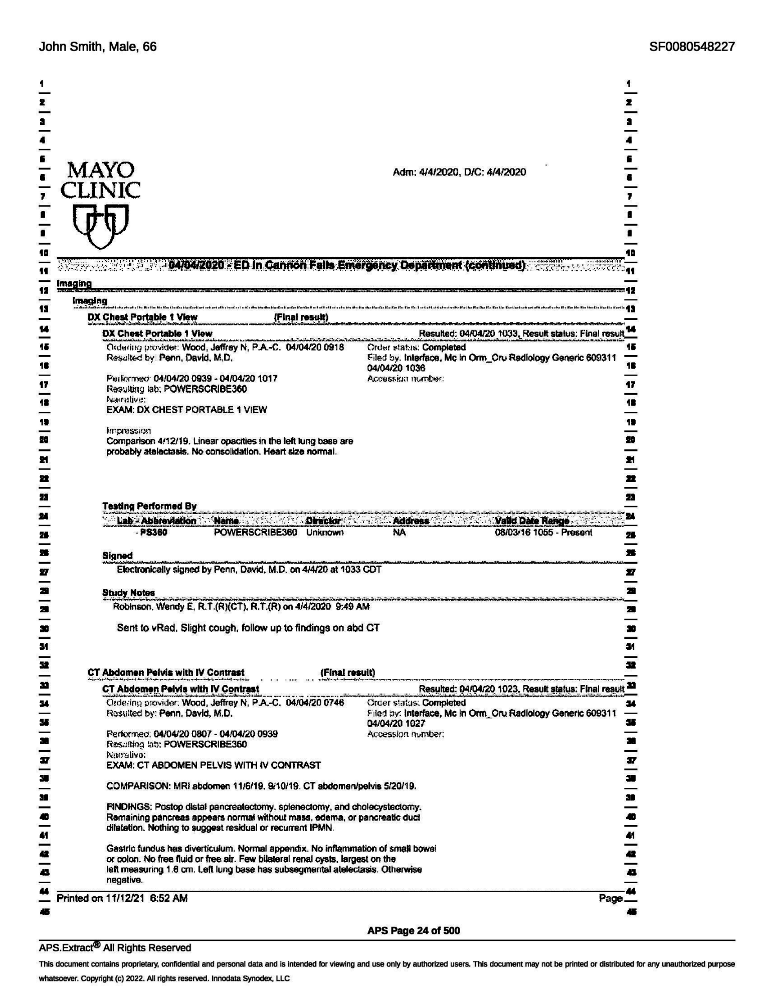

In [ ]:
image = cv2.imread("doc.jpg")

# increase the font size using dilation
image_smoothed = thick_font(image) 

img_display(image_smoothed)

In [ ]:
custom_config = r'--oem 3 --psm 12'
print('--------------------------------------------------------------')
# extract text from image
text_data = pytesseract.image_to_string(image_smoothed, config=custom_config)
text_b = TextBlob(text_data)
corrected = text_b.correct()
print(corrected)
print('--------------------------------------------------------------')

--------------------------------------------------------------
John Smith, Pale, 66

SF0080548227

MAYO

Him: 4/4/2020, D/C: 4/4/2020

CLINIC

elelul~level@iii"i-

a

|

acts:

regency He

Ma

a

a a

42

=

Making

miss

it vent

he be net of ah he

on

eat

a ai te take A i Coat se Is in head et a ta In to

est Portable t

{I

—

income

see errand peri

left

of Chest Portable 1 View

this hilasrtadnate

Rates

Resulted: 04/04/20 1033, Result status: Final result

“Trust st

18:

ted

1

“Adding 1 prone her. Had, Geoffrey of. PAG. “par0ara0 oak

—

Resulted by: Penn, David, M.D,

Piled by. Interface, C In Orm_Cry Radiology Genetic 609311

16

04/04/20 1036

Puitormed: 04/04/20 0939 - 04/04/20 1017

Accession number

Resulting cab:s POWERSCRIBE360

Reaureatives

EXAM: of CHEST PORTABLE 14 VIEW

Impression

Comparison 4/12/19. Linear opacities in the left lung base are

probably atelectasis. To consolidation. Heart size normal.

jcmereeeee

S360

POWERSCRIBE360 Unknown

08/03/16 1055 

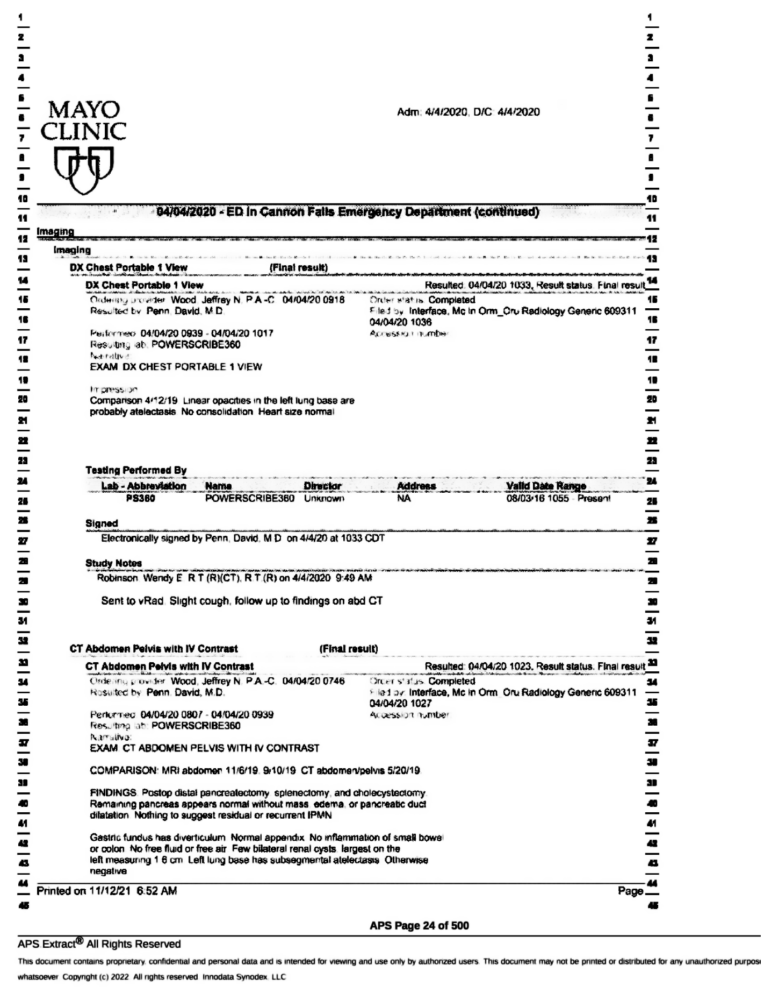

In [ ]:
# Cropping an image
cropped_image = image[150:2300, 50:1615]  # slicing image[rows, columns]

# removing noise
noiseless_image_bw = cv2.fastNlMeansDenoising(cropped_image, None, 40, 7, 21)
image_smoothed = thick_font(noiseless_image_bw) 

img_display(image_smoothed)

In [ ]:
custom_config = r'--oem 3 --psm 12'
print('--------------------------------------------------------------')
# extract text from image
text_data = pytesseract.image_to_string(image_smoothed, config=custom_config)
text_b = TextBlob(text_data)
corrected = text_b.correct()
print(corrected)
print('--------------------------------------------------------------')

--------------------------------------------------------------
MAYO

Him. 4/4/2020, DIC 4/4/2020

CLINIC

sleep~level@iii"i-

TED In Cannon Walls Emergency Department (continued)

Main:

a

mm

Making

.

of Oh Portable t View.

she oe at

ereereerereenene

{Final result)

rest need

[2/8 ]3]

of Chest Portable 1 View

fe

me aden

toi ma

Resulted. 04/04/20 1033, Result status. Final result

rent

K tate

i

“Madam my e ‘ever Good Geoffrey of of-C 0404190 0916

Freer station. Completed

5

Resulted by Penn David. of

Piled of Interface, C in Orm_Cny Radiology Genetic 609311 —

04/04/20 1036

1

Feiterras 04/04/20 0939 - 04/04/20 1017

Acres

varieties

=

ve

Resvitng

in. POWERSCRIBE360

Met real

EXAM of CHEST PORTABLE 1 VIEW

Or press. 0

Companion 4/42/19 Linear opacities in the left lung base are

probably atelectasis To consolidation Heart size normal

Resting Performed By

a

=

Ten

eye ne he

Said Late ¥

f

S360

POWERSCRIBE360 Unknown

A

08/0316 1085 - Present!

Signed

El